# RNA–ATAC dynamics in developing kidney organoids

This tutorial uses the GSE213152 example to show how MOFI connects RNA and ATAC snapshots across time. We will reconstruct the shared dynamics, inspect cell-fate and marker trends, and visualize trajectories in both modalities.

The released fitted objects are used so that the notebook focuses on the downstream API a reader will reuse after training a model of their own.


## Workflow

1. Locate the released RNA, ATAC, dynamics, and mapping objects.
2. Run dense-time inference and the standard downstream analysis.
3. Draw one biological result at a time: synchronized corridor, fate dynamics, marker bridging, trajectories, and growth.
4. Identify the parameters to replace for another dataset.


In [ ]:
from pathlib import Path
import json

from mofi_notebook import setup_notebook, suppress_live_plot_output

# Run Jupyter from the repository root. The helper selects CUDA when available.
ROOT, DEVICE, _ = setup_notebook()
print(f"Repository: {ROOT}")
print(f"Device: {DEVICE}")


## 1. Locate the fitted data objects

`require_paper_data` resolves the dataset-specific files used by the public API. For your own study, these paths correspond to the trained dynamics `AnnData`, processed modalities, and the fitted cross-modality map.


In [ ]:
from CytoBridge.reproducibility import require_paper_data

DATASET = "gse213152"
paths = require_paper_data(DATASET, ROOT)
paths


## 2. Reconstruct dense-time dynamics

This call performs inference with the released model and creates the cell-fate result used below. `reuse_cache=True` makes the notebook restartable; it does not change the analysis when no cached result exists.


In [ ]:
from CytoBridge.reproducibility import run_real_downstream

paper_output = ROOT / "results" / "figure_3_paper"
with suppress_live_plot_output():
    downstream = run_real_downstream(
        DATASET,
        output_dir=paper_output,
        selected_figures=["cell_type_main"],
        device=DEVICE,
        sample_max_cells=None,
        reuse_cache=True,
        repo_root=ROOT,
    )
run_dir = Path(downstream["run_dir"])
run_dir


## 3. Compare RNA and ATAC trajectories

The synchronized corridor uses the same starting cells and time grid in both modalities. This is useful for checking whether an RNA transition has a matching chromatin transition.


In [ ]:
from CytoBridge.manuscript import render_synchronized_corridor

corridor_dir = run_dir / "figures" / "synchronized_corridor"
with suppress_live_plot_output():
    render_synchronized_corridor(
        DATASET,
        output_dir=corridor_dir,
        device=DEVICE,
        direction="1to2",
        repo_root=ROOT,
    )
corridor_dir


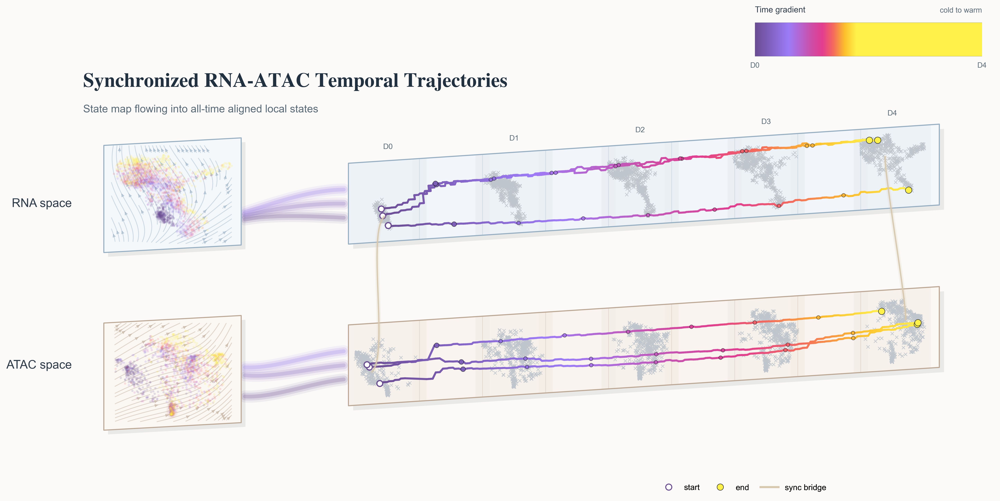

In [ ]:
from mofi_notebook import show_paper_panel
show_paper_panel(corridor_dir / "sync_multimodal_time_corridor.png")


## 4. Inspect cell-fate dynamics

The fate panel summarizes how predicted cell-type composition changes along the reconstructed process.


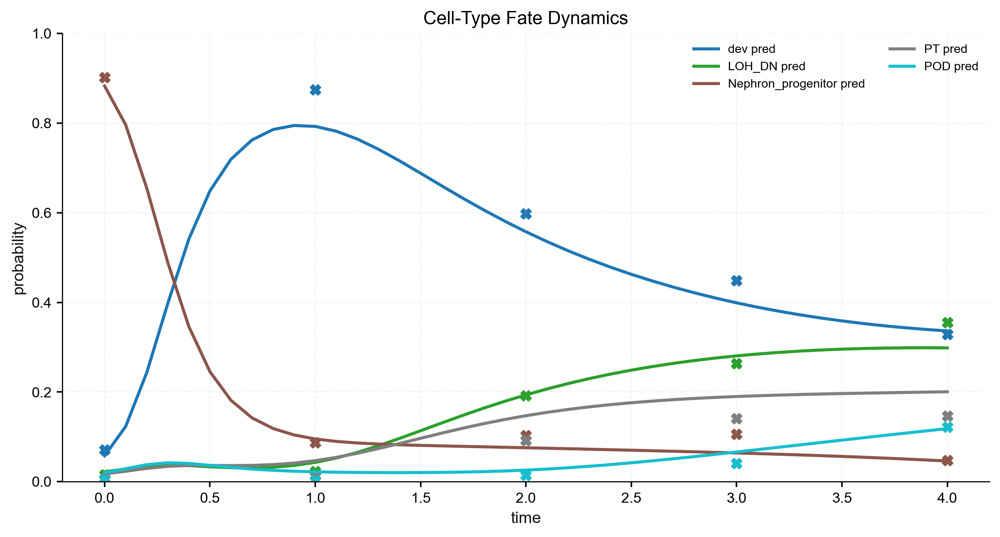

In [ ]:
from mofi_notebook import show_paper_panel
show_paper_panel(run_dir / "figures" / "cell_type_fate_dynamics.png")


## 5. Follow marker programs across modalities

`plot_marker_bridging` compares model-predicted trends with observed time-point means. Marker names are ordinary function arguments, so this cell is the main template for a new biological question.


In [ ]:
from CytoBridge.manuscript import plot_marker_bridging

with suppress_live_plot_output():
    marker_outputs = plot_marker_bridging(
        DATASET,
        run_dir=run_dir,
        output_dir=run_dir / "figures" / "manuscript_markers",
        markers_by_modality={
            "main_var": ["HNF1B", "PAX8"],
            "sec_var": ["EYA1", "PAX8"],
        },
        config_output_dir=paper_output,
        device=DEVICE,
        repo_root=ROOT,
    )
marker_outputs


### RNA markers: HNF1B and PAX8


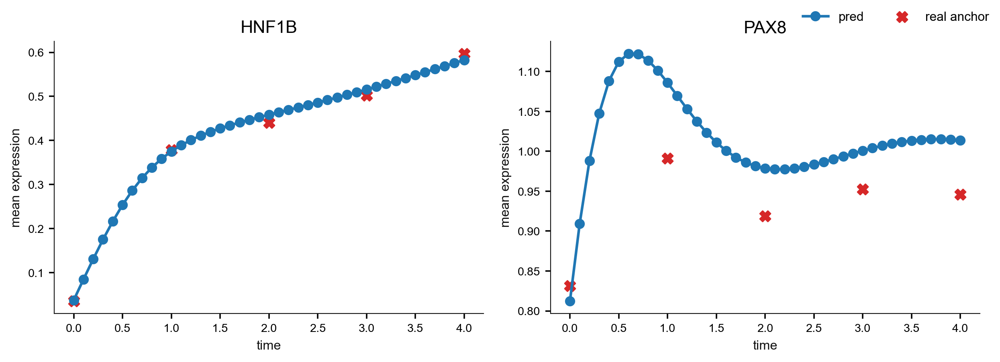

In [ ]:
from mofi_notebook import show_paper_panel
show_paper_panel(run_dir / "figures" / "manuscript_markers" / "HNF1B_PAX8.png")


### ATAC-linked markers: EYA1 and PAX8


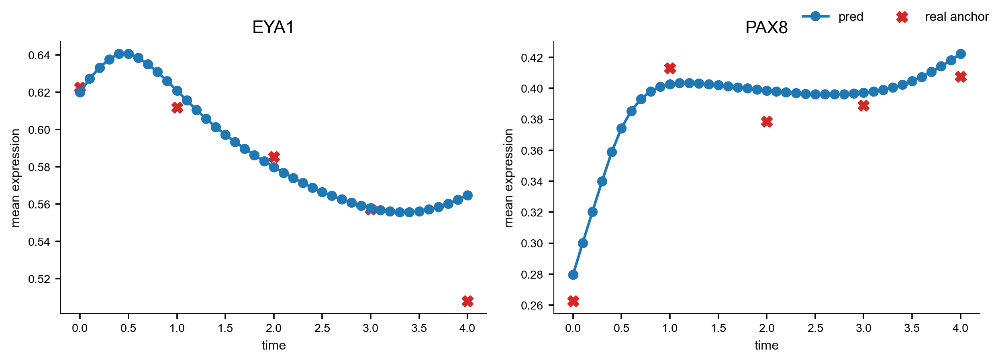

In [ ]:
from mofi_notebook import show_paper_panel
show_paper_panel(run_dir / "figures" / "manuscript_markers" / "EYA1_PAX8.png")


## 6. Plot trajectories and growth in each modality

The high-level ODE helper uses the released modality-specific UMAP models. It returns explicit output paths, which can be passed directly to display or downstream reporting code.


In [ ]:
from CytoBridge.reproducibility import run_paper_ode_v3

with suppress_live_plot_output():
    ode_v3 = run_paper_ode_v3(
        DATASET,
        output_dir=run_dir / "figures" / "paper_ode_v3",
        device=DEVICE,
        repo_root=ROOT,
    )
ode_v3["outputs"]


### RNA trajectories


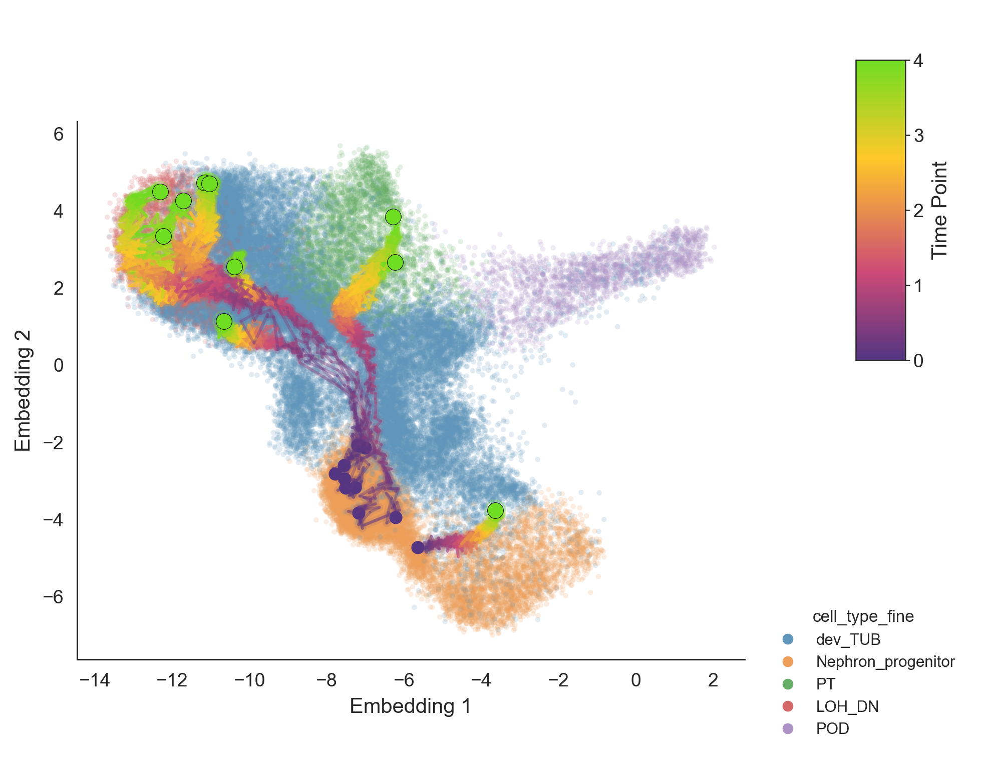

In [ ]:
from mofi_notebook import show_paper_panel
show_paper_panel(Path(ode_v3["outputs"]["primary_trajectory_png"]))


### ATAC trajectories


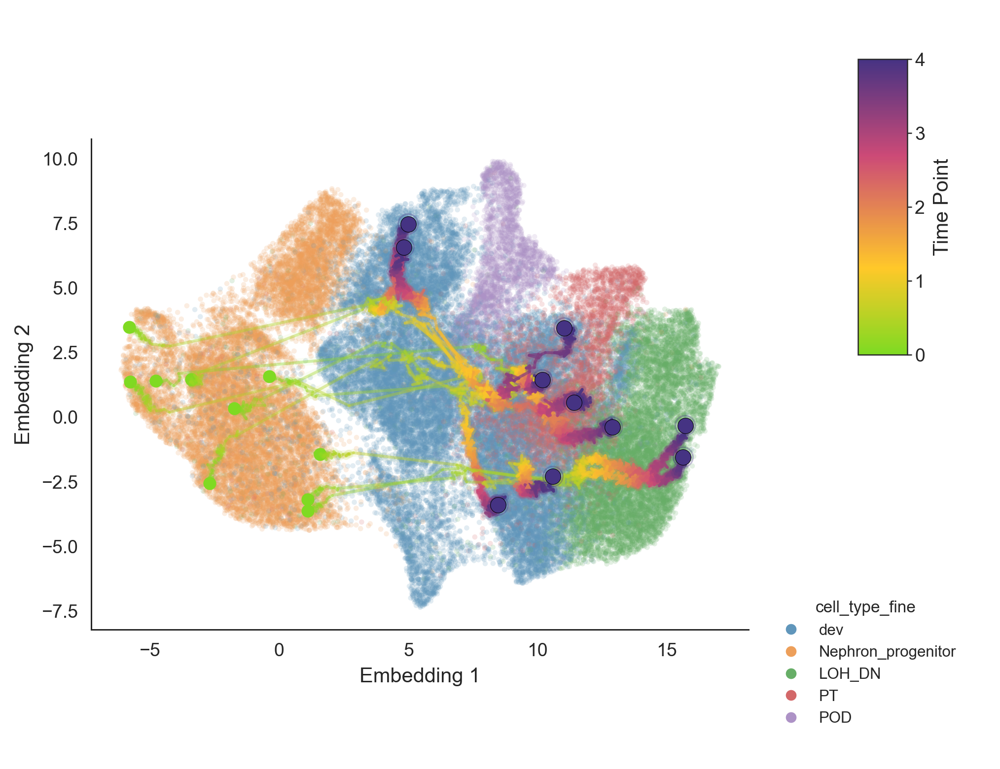

In [ ]:
from mofi_notebook import show_paper_panel
show_paper_panel(Path(ode_v3["outputs"]["secondary_trajectory_png"]))


### Growth in RNA space


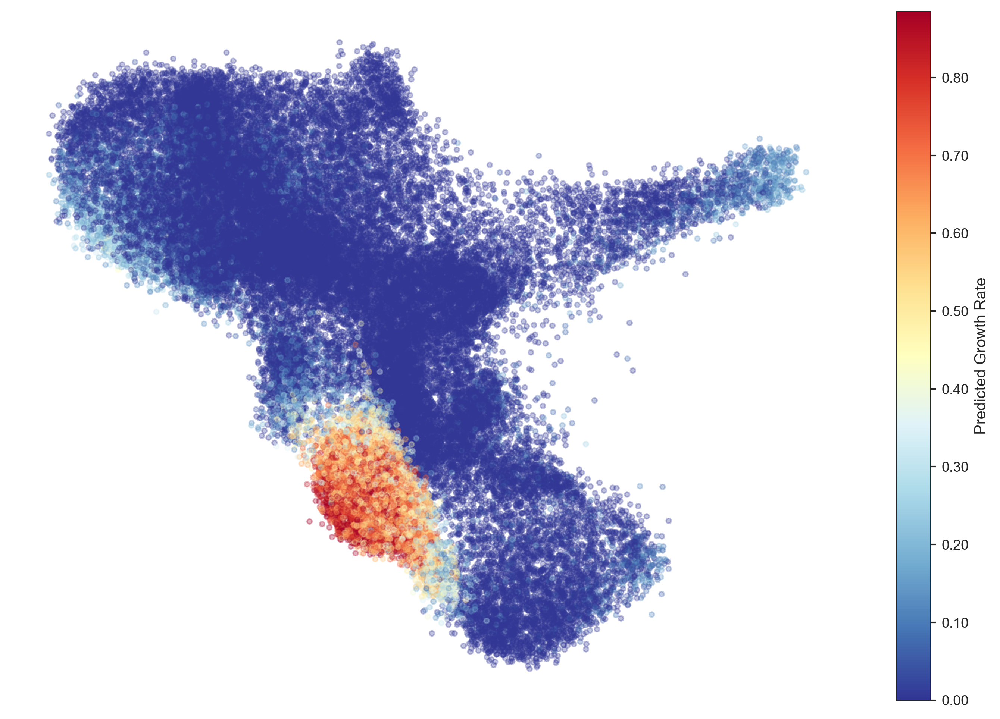

In [ ]:
from mofi_notebook import show_paper_panel
show_paper_panel(Path(ode_v3["outputs"]["primary_growth_png"]))


### Growth in ATAC space


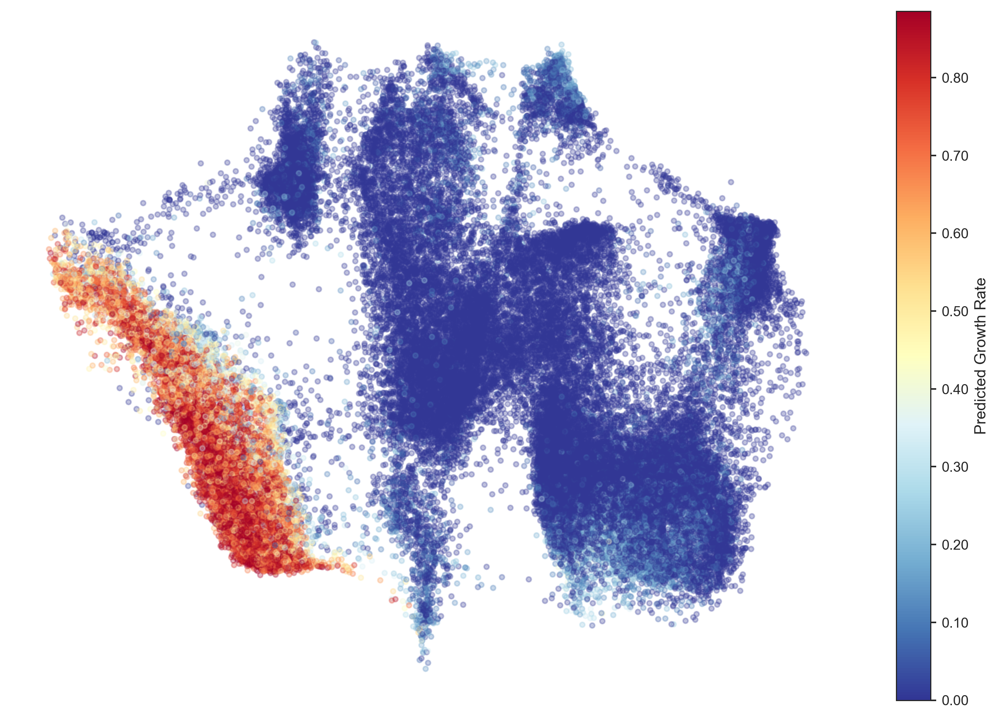

In [ ]:
from mofi_notebook import show_paper_panel
show_paper_panel(Path(ode_v3["outputs"]["secondary_growth_png"]))


## Apply the workflow to your own data

The figure-specific helpers above keep the paper example concise, but the reusable workflow is the same for another RNA–ATAC dataset:

1. Put time labels and cell-type labels in `adata.obs`.
2. Preprocess each modality with `CytoBridge.pp.preprocess`.
3. Train the dynamics model with `CytoBridge.tl.fit` and save the returned `AnnData` object.
4. Fit or load the cross-modality map.
5. Reuse the plotting calls shown above with your own paths, marker names, perturbation targets, and time points.

```python
import scanpy as sc
import CytoBridge as cb

adata = sc.read_h5ad("my_data.h5ad")
adata = cb.pp.preprocess(
    adata,
    time_key="time",
    dim_reduction="PCA",
    normalization=True,
    log1p=True,
    select_hvg=True,
)
adata = cb.tl.fit(adata, config="ruot", device=DEVICE)
adata.write_h5ad("my_data_with_mofi_model.h5ad")
```

Start by changing only the input paths and metadata keys. Once that run works, change biological choices such as markers, source populations, perturbation scores, or displayed cell types.
